# Single-Organoid Crypt Segmentation Illustration

This notebook reproduces the old single-organoid crypt illustration workflow using the current `organograph` codebase. It runs the modern crypt segmentation steps on one membrane mesh, stores the intermediate results in a dictionary, and creates the requested mesh and profile figures.


In [ ]:
# -----------------------------------------------------------------------------
# Configuration
# -----------------------------------------------------------------------------
from pathlib import Path
import sys

import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Resolve the repository root whether the notebook is launched from the repo root
# or directly from the notebooks/ directory.
CWD = Path.cwd().resolve()
REPO_ROOT = CWD.parent if CWD.name == "notebooks" else CWD
if str(REPO_ROOT / "src") not in sys.path:
    sys.path.insert(0, str(REPO_ROOT / "src"))
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from organograph.io_utils.dataset_config import load_mesh_dataset_config

# --- Example organoid from legacy/visualisations_single_organoid.ipynb ---
DATASET = "20251201"  # "20250929" or "20251201"
DATA_ROOT = REPO_ROOT.parent / "NicoleData" / DATASET
MESH_DATA_DIR = DATA_ROOT / "fractal_output"
MESH_CONFIG_PATH = DATA_ROOT / "mesh_config.json"
VOCAB_PATH = REPO_ROOT / "sim" / "vocab_with_meta.npz"

# Pick one organoid. The zarr, round, and mesh folder are read from mesh_config.json.
TIMEPOINT = "day4p5"
WELL = "B03"
ORGANOID_ID = "144"

mesh_cfg = load_mesh_dataset_config(MESH_CONFIG_PATH)
ZARR_NAME_BY_TP = mesh_cfg["zarr_name_by_tp"]
ROUND_BY_TP = mesh_cfg["round_by_tp"]
MESHNAME_BY_TP = mesh_cfg["meshname_by_tp"]
WELLS_BY_TP = mesh_cfg.get("wells_by_tp", {})

if TIMEPOINT not in ZARR_NAME_BY_TP:
    raise KeyError(
        f"TIMEPOINT {TIMEPOINT!r} not found in {MESH_CONFIG_PATH}. "
        f"Available timepoints: {sorted(ZARR_NAME_BY_TP)}"
    )
if TIMEPOINT in WELLS_BY_TP and WELL not in WELLS_BY_TP[TIMEPOINT]:
    raise ValueError(
        f"WELL {WELL!r} is not listed for TIMEPOINT {TIMEPOINT!r} in {MESH_CONFIG_PATH}. "
        f"Available wells: {WELLS_BY_TP[TIMEPOINT]}"
    )

MESH_PATH = (
    MESH_DATA_DIR
    / TIMEPOINT
    / ZARR_NAME_BY_TP[TIMEPOINT]
    / WELL[0]
    / WELL[1:]
    / ROUND_BY_TP[TIMEPOINT]
    / "meshes"
    / MESHNAME_BY_TP[TIMEPOINT]
    / f"{ORGANOID_ID}.vtp"
)

# --- Mesh smoothing ---
SMOOTH_MESH_LMAX = 10

# --- Segmentation settings ---
DETECTION_THRESHOLD = 0.5
REFINE_CRYPTS = True

# Boundary overlay before final distance-grown regions:
#   "detected" -> first-detection patches after filters
#   "refined"  -> patches after the optional refine_crypts/subdivision step
PRE_FINAL_BOUNDARY_STAGE = "detected"

REFINE_THRESHOLD = 0.0
REFINE_ONLY_IF_AREA_AT_LEAST = 5.0
MIN_REFINED_FRAC_OF_PARENT = 0.05
EXTEND_MAX = 2.0
DISC_RESOLUTION = 200
REMOVE_NESTED_FEATURES = True

# --- Candidate filters ---
MIN_HKS_PERCENT_GREATER = 3.0
HKS_FILTER_T_MAX = 10.0
MIN_PATCH_VERTS = 25
MIN_PATCH_AREA = None

# --- Figure settings ---
HKS_TIME_FOR_PLOT = 1.0
SAMPLED_HKS_VERTEX_IDS = [15750, 10642, 8889]
SAMPLED_HKS_VERTEX_COLORS = ["black", "magenta", "limegreen"]
SAMPLED_HKS_VERTEX_SIZE = 3

# Distance-field figure: zero-based final crypt index. Change this to inspect a different crypt.
DISTANCE_FIELD_CRYPT_INDEX = 0

# Final crypt-axis regions for the crypt/neck/villus figure and VTP export.
CRYPT_REGION_MAX_S = 0.75
NECK_REGION_MAX_S = 1.1
CRYPT_NECK_VILLUS_COLORS = {
    1: "#2166ac",  # crypt
    2: "#fdae61",  # neck
    3: "#bdbdbd",  # villus
}
CRYPT_NECK_VILLUS_NAMES = {
    1: "Crypt",
    2: "Neck",
    3: "Villus",
}

N_ISOCURVES = 16
ISO_MAX_PERCENTILE = 95
BOUNDARY_LINE_WIDTH = 9
BOUNDARY_SAMPLE_POINTS = 30
BOUNDARY_OUTWARD_OFFSET_FRACTION = 0.001
BOTTOM_POINT_SIZE = 3.0
INITIAL_BOUNDARY_COLOR = "black"
FINAL_BOUNDARY_COLOR = "#ffb000"
FIG_WIDTH = 750
FIG_HEIGHT = 550
# LEGACY_CAMERA = dict(eye=dict(x=-0.30704142457365324, y=-1.5463306466499531, z=1.4839430901577453)) # crypt index 2
LEGACY_CAMERA = dict(eye=dict(x=1.8535201938998949, y=0.21851804876029274, z=1.0973662803145023)) # crypt index 0


# --- Figure export settings ---
EXPORT_FIGURES = True
FIGURE_EXPORT_ROOT = REPO_ROOT / "exports" / "single_organoid_crypt_segmentation"
CURVE_FIGSIZE = (3.15, 2.7)
CURVE_SUBPLOT_ADJUST = dict(left=0.18, right=0.97, bottom=0.22, top=0.86)


print("REPO_ROOT =", REPO_ROOT)
print("DATA_ROOT =", DATA_ROOT)
print("MESH_CONFIG_PATH =", MESH_CONFIG_PATH)
print("MESH_DATA_DIR =", MESH_DATA_DIR)
print("TIMEPOINT =", TIMEPOINT)
print("WELL =", WELL)
print("ORGANOID_ID =", ORGANOID_ID)
print("MESH_PATH =", MESH_PATH)
print("VOCAB_PATH =", VOCAB_PATH)


REPO_ROOT = /home/fmoller/Projects/LearningOrganoids/OrganoGraph
DATA_ROOT = /home/fmoller/Projects/LearningOrganoids/NicoleData/20251201
MESH_CONFIG_PATH = /home/fmoller/Projects/LearningOrganoids/NicoleData/20251201/mesh_config.json
MESH_DATA_DIR = /home/fmoller/Projects/LearningOrganoids/NicoleData/20251201/fractal_output
TIMEPOINT = day4p5
WELL = B03
ORGANOID_ID = 144
MESH_PATH = /home/fmoller/Projects/LearningOrganoids/NicoleData/20251201/fractal_output/day4p5/251130R0.zarr/B/03/2_zillum_registered/meshes/nnorg_corrected_smoothed_annotated_by_projection/144.vtp
VOCAB_PATH = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/sim/vocab_with_meta.npz


In [129]:
# -----------------------------------------------------------------------------
# Imports from the current codebase
# -----------------------------------------------------------------------------
from organograph.mesh.OrganoidMesh import OrganoidMesh
from organograph.mesh.hks import compute_hks
from organograph.mesh.geodesics import compute_geodesics_dijkstra

from organograph.crypts.vocab import detect_crypts_by_encoding, subdivide_crypts_by_encoding
from organograph.crypts.filters import filter_crypts_by_hks_percent, filter_crypts_by_size, apply_filters, subset_per_crypt_vars
from organograph.crypts.axis import (
    compute_crypt_axis,
    normalize_crypt_axis_to_neckline,
    assign_features_by_distance,
    _get_boundary_vertices,
)
from organograph.crypts.analysis import calc_crypt_constriction, calc_crypt_elongation
from organograph.plotting.meshes import plot_organoid_mesh, plot_mesh_by_regions, add_mesh_overlay


## 1) Load the Mesh and Vocabulary

The mesh is normalized with the same `OrganoidMesh.normalize_inplace()` convention used by the current preprocessing scripts. The Laplace-Beltrami eigendecomposition is computed once and reused for HKS-based steps.


In [130]:
if not MESH_PATH.exists():
    raise FileNotFoundError(
        f"Mesh not found: {MESH_PATH}\n"
        "Adjust DATA_ROOT or the organoid selection in the configuration cell."
    )
if not VOCAB_PATH.exists():
    raise FileNotFoundError(f"Vocabulary not found: {VOCAB_PATH}")

label_uid = f"{TIMEPOINT}_{WELL}_{ORGANOID_ID}"
FIGURE_EXPORT_DIR = FIGURE_EXPORT_ROOT / label_uid
FIGURE_EXPORT_DIR.mkdir(parents=True, exist_ok=True)

mesh = OrganoidMesh(str(MESH_PATH))
mesh.normalize_inplace()
mesh.label_uid = label_uid

# Smooth the displayed/analysed surface by reconstructing the vertex coordinates
# from low Laplace-Beltrami modes. OrganoidMesh interprets lmax as spectral
# level, i.e. it keeps int(lmax**2) eigenfunctions.
mesh.compute_spectral_coefficients(lmax=SMOOTH_MESH_LMAX)
mesh.v = np.asarray(mesh.reconstruct_from_coeffs(mesh.coeffs_v, lmax=SMOOTH_MESH_LMAX), dtype=float)

# Recompute geometry-dependent operators/eigenmodes on the smoothed surface so
# HKS, vocabulary encoding, geodesics, and circumference estimates use the same mesh.
mesh.laplacian = None
mesh.mass_matrix = None
mesh.eigvals = None
mesh.eigvecs = None
mesh.coeffs_v = None
mesh.lmax = None
mesh._eig_decomp()

vocab = np.load(VOCAB_PATH, allow_pickle=True)

print("label_uid =", label_uid)
print("FIGURE_EXPORT_DIR =", FIGURE_EXPORT_DIR)
print("vertices =", mesh.v.shape)
print("faces =", mesh.f.shape)
print("smoothing lmax =", SMOOTH_MESH_LMAX)
print("vocab keys =", list(vocab.keys()))


[Info] Eigen-decomposition not found. Computing now...
label_uid = day4p5_B03_144
FIGURE_EXPORT_DIR = /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144
vertices = (18001, 3)
faces = (35998, 3)
smoothing lmax = 10
vocab keys = ['vocab', 'scaler', 'ts', 'sigma', 'L_ref', 'crypt_vocab_idx']


## 2) Run Segmentation Step by Step

This mirrors the current `segment_crypts_organoid()` implementation, but keeps named intermediate outputs for plotting and inspection.


In [131]:
filters = [
    lambda patches, **kw: filter_crypts_by_hks_percent(
        patches,
        min_percent_greater=MIN_HKS_PERCENT_GREATER,
        t_max=HKS_FILTER_T_MAX,
        **kw,
    ),
    lambda patches, **kw: filter_crypts_by_size(
        patches,
        min_patch_verts=MIN_PATCH_VERTS,
        min_patch_area=MIN_PATCH_AREA,
        **kw,
    ),
]

seg = {}
seg["vertex_areas"] = np.asarray(mesh.vertex_areas(), float)

# Initial crypt seeding from vocabulary encoding.
seed_patches_raw, enc_vars = detect_crypts_by_encoding(
    vocab,
    mesh,
    threshold=DETECTION_THRESHOLD,
    return_intermediates=True,
)
seg.update({
    "seed_patches_raw": seed_patches_raw,
    "encoding": enc_vars["encoding"],
    "vertex_score": enc_vars["vertex_score"],
    "patch_scores": enc_vars["patch_scores"],
    "ts_mesh": enc_vars["ts_mesh"],
    "ts_vocab": enc_vars["ts_vocab"],
    "hks_segment": enc_vars["hks"],
    "normalised_hks_segment": enc_vars["norm_hks"],
})

# Filters applied to initial seed patches.
seed_patches_filtered, filter_info_initial, keep_idx_initial = apply_filters(
    seed_patches_raw,
    filters=filters,
    mesh=mesh,
    seg_vars=seg,
)
seg["seed_patches_filtered"] = seed_patches_filtered
seg["filter_info_initial"] = filter_info_initial
seg["keep_idx_initial"] = keep_idx_initial

def connected_components_from_vertex_mask(mesh, mask):
    """Connected components of a boolean vertex mask on the mesh edge graph."""
    mask = np.asarray(mask, dtype=bool)
    faces = np.asarray(mesh.f, dtype=np.int64)
    adj = [[] for _ in range(mask.size)]
    for a, b, c in faces:
        a = int(a); b = int(b); c = int(c)
        adj[a].extend((b, c))
        adj[b].extend((a, c))
        adj[c].extend((a, b))

    visited = np.zeros(mask.size, dtype=bool)
    components = []
    for v0 in np.flatnonzero(mask):
        if visited[v0]:
            continue
        stack = [int(v0)]
        visited[v0] = True
        comp = set()
        while stack:
            u = stack.pop()
            comp.add(int(u))
            for v in adj[u]:
                if mask[v] and not visited[v]:
                    visited[v] = True
                    stack.append(int(v))
        components.append(comp)
    return components


def refined_boundary_patches_from_score(mesh, parent_patches, vertex_score, threshold, min_frac_of_parent=None):
    """
    Visualization-only refined boundaries from the local refined vertex score.

    Unlike subdivide_crypts_by_encoding(), this keeps the thresholded component
    even when there is only one component, so REFINE_THRESHOLD visibly changes
    the plotted boundary.
    """
    score = np.asarray(vertex_score, dtype=float)
    out = []
    for parent in parent_patches:
        parent_idx = np.fromiter(parent, dtype=np.int64)
        mask = np.zeros(score.shape[0], dtype=bool)
        mask[parent_idx] = score[parent_idx] >= float(threshold)
        comps = connected_components_from_vertex_mask(mesh, mask)

        kept = []
        for comp in comps:
            if min_frac_of_parent is not None:
                if len(comp) < float(min_frac_of_parent) * max(len(parent), 1):
                    continue
            kept.append(comp)

        if kept:
            out.extend(kept)
        else:
            out.append(parent)
    return out


# Optional local refinement / subdivision of crypt candidates.
if REFINE_CRYPTS:
    refined_patches, refine_vars = subdivide_crypts_by_encoding(
        vocab,
        mesh,
        patches=seed_patches_filtered,
        threshold=REFINE_THRESHOLD,
        refine_only_if_area_at_least=REFINE_ONLY_IF_AREA_AT_LEAST,
        min_refined_frac_of_parent=MIN_REFINED_FRAC_OF_PARENT,
        return_intermediates=True,
    )
    refined_boundary_patches = refined_boundary_patches_from_score(
        mesh,
        seed_patches_filtered,
        refine_vars["vertex_score"],
        REFINE_THRESHOLD,
        min_frac_of_parent=MIN_REFINED_FRAC_OF_PARENT,
    )
else:
    refined_patches = seed_patches_filtered
    refine_vars = {}
    refined_boundary_patches = seed_patches_filtered

seg["refined_patches"] = refined_patches
seg["refined_boundary_patches"] = refined_boundary_patches
seg["refine_vars"] = refine_vars

# Crypt bottoms and geodesic axes.
dnorm_initial, L_crypt_initial, bottom_vertex_ids_initial = compute_crypt_axis(
    mesh,
    refined_patches,
    compute_geodesics_dijkstra,
    geodesic_kwargs={},
)
seg["d_crypts_initial"] = dnorm_initial
seg["L_crypts_initial"] = L_crypt_initial
seg["bottom_vertex_ids_initial"] = bottom_vertex_ids_initial

# Normalize the distance axis so that the inferred neckline sits near s=1.
d_discretized = np.linspace(0.01, float(EXTEND_MAX), int(DISC_RESOLUTION))
search_interval = (0.8, float(d_discretized[-1]))
circumference_crypts, dnorm_neck, L_crypts = normalize_crypt_axis_to_neckline(
    mesh,
    dnorm_initial,
    d_discretized,
    search_interval=search_interval,
    L_crypt=L_crypt_initial,
)
seg["d_discretized"] = d_discretized
seg["circumference_crypts_premerge"] = circumference_crypts
seg["d_crypts_premerge"] = dnorm_neck
seg["L_crypts_premerge"] = L_crypts

# Grow final crypt regions by nearest normalized distance and remove nested features.
crypts_extended_pre_filter, best_feature, best_dist, keep_idx_merge = assign_features_by_distance(
    dnorm_neck,
    remove_nested_features=REMOVE_NESTED_FEATURES,
)
seg["crypts_extended_pre_filter"] = crypts_extended_pre_filter
seg["best_feature"] = best_feature
seg["best_dist"] = best_dist
seg["keep_idx_merge"] = keep_idx_merge

constrictions = calc_crypt_constriction(d_discretized, circumference_crypts)
elongations = calc_crypt_elongation(d_discretized, circumference_crypts, L_crypts)

# Final filters after growth, matching segment_crypts_organoid().
crypts_final, filter_info_final, keep_idx_final_local = apply_filters(
    crypts_extended_pre_filter,
    filters=filters,
    mesh=mesh,
    seg_vars=seg,
)
keep_idx_final = np.asarray(keep_idx_merge, dtype=np.int64)[np.asarray(keep_idx_final_local, dtype=np.int64)]

aligned = subset_per_crypt_vars(
    keep_idx_final,
    bottom_vertex_ids=bottom_vertex_ids_initial,
    d_crypts=dnorm_neck,
    L_crypts=L_crypts,
    circumference_crypts=circumference_crypts,
    crypt_constrictions=constrictions,
    crypt_elongations=elongations,
)

seg.update(aligned)
seg["crypts_final"] = crypts_final
seg["filter_info_final"] = filter_info_final
seg["keep_idx_final"] = keep_idx_final

print(f"raw seed patches:      {len(seed_patches_raw)}")
print(f"filtered seed patches: {len(seed_patches_filtered)}")
print(f"refined patches:       {len(refined_patches)}")
print(f"refined boundary patches: {len(refined_boundary_patches)}")
print(f"final crypt regions:   {len(crypts_final)}")
print("bottom vertices:", np.asarray(seg["bottom_vertex_ids"], dtype=int).tolist())


raw seed patches:      3
filtered seed patches: 3
refined patches:       4
refined boundary patches: 4
final crypt regions:   3
bottom vertices: [7671, 10515, 15005]


## 3) Plotting Helpers


In [132]:
def patch_boundary_vertices(mesh, patches):
    boundaries = []
    for patch in patches:
        if patch is None or len(patch) == 0:
            boundaries.append(np.empty((0,), dtype=np.int64))
            continue
        boundaries.append(_get_boundary_vertices(mesh, patch_vertices=np.fromiter(patch, dtype=np.int64)))
    return boundaries


def best_seed_patch_for_final(final_patch, seed_patches):
    if not seed_patches:
        return None, -1
    final_set = set(final_patch)
    overlaps = [len(final_set & set(seed)) for seed in seed_patches]
    if max(overlaps) <= 0:
        return None, -1
    idx = int(np.argmax(overlaps))
    return seed_patches[idx], idx


_MESH_EDGE_ADJ_CACHE = {}


def mesh_edge_adjacency(mesh):
    """Weighted mesh-edge adjacency, cached by mesh object id."""
    key = id(mesh)
    cached = _MESH_EDGE_ADJ_CACHE.get(key)
    if cached is not None:
        return cached

    vertices = np.asarray(mesh.v, float)
    faces = np.asarray(mesh.f, dtype=np.int64)
    edges = np.vstack([
        faces[:, [0, 1]],
        faces[:, [1, 2]],
        faces[:, [2, 0]],
    ])
    edges = np.unique(np.sort(edges, axis=1), axis=0)

    adj = [[] for _ in range(vertices.shape[0])]
    lengths = np.linalg.norm(vertices[edges[:, 0]] - vertices[edges[:, 1]], axis=1)
    for (a, b), w in zip(edges, lengths):
        a = int(a)
        b = int(b)
        w = float(w)
        adj[a].append((b, w))
        adj[b].append((a, w))

    _MESH_EDGE_ADJ_CACHE[key] = adj
    return adj


def dijkstra_vertex_path(mesh, source, target):
    """Shortest path along mesh edges from source to target, stopping once target is reached."""
    import heapq

    source = int(source)
    target = int(target)
    if source == target:
        return [source]

    adj = mesh_edge_adjacency(mesh)
    dist = {source: 0.0}
    prev = {}
    heap = [(0.0, source)]
    visited = set()

    while heap:
        d, u = heapq.heappop(heap)
        if u in visited:
            continue
        visited.add(u)
        if u == target:
            break
        for v, w in adj[u]:
            if v in visited:
                continue
            nd = d + w
            if nd < dist.get(v, np.inf):
                dist[v] = nd
                prev[v] = u
                heapq.heappush(heap, (nd, v))

    if target not in dist:
        return [source, target]

    path = [target]
    cur = target
    while cur != source:
        cur = prev[cur]
        path.append(cur)
    path.reverse()
    return path


def ordered_boundary_vertices(mesh, patch_or_vertices):
    """Return boundary vertices ordered around the largest boundary component."""
    ids = np.fromiter((int(v) for v in patch_or_vertices), dtype=np.int64)
    if ids.size == 0:
        return ids

    faces = np.asarray(mesh.f, dtype=np.int64)
    keep_faces = np.isin(faces, ids).all(axis=1)
    patch_faces = faces[keep_faces]

    if patch_faces.size:
        edges = np.vstack([
            patch_faces[:, [0, 1]],
            patch_faces[:, [1, 2]],
            patch_faces[:, [2, 0]],
        ])
        edges = np.sort(edges, axis=1)
        uniq_edges, counts = np.unique(edges, axis=0, return_counts=True)
        boundary_edges = uniq_edges[counts == 1]

        if boundary_edges.size:
            adj = {}
            for a, b in boundary_edges:
                adj.setdefault(int(a), []).append(int(b))
                adj.setdefault(int(b), []).append(int(a))

            remaining = set(adj)
            components = []
            while remaining:
                seed = remaining.pop()
                stack = [seed]
                comp = {seed}
                while stack:
                    u = stack.pop()
                    for v in adj.get(u, []):
                        if v not in comp:
                            comp.add(v)
                            remaining.discard(v)
                            stack.append(v)
                components.append(comp)

            comp = max(components, key=len) if components else set()
            if len(comp) >= 3:
                start_v = min(comp)
                ordered = []
                prev = None
                cur = start_v
                visited = set()
                for _ in range(len(comp) + 2):
                    ordered.append(cur)
                    visited.add(cur)
                    candidates = [v for v in adj.get(cur, []) if v in comp and v != prev]
                    unvisited = [v for v in candidates if v not in visited]
                    if unvisited:
                        nxt = unvisited[0]
                    elif start_v in candidates:
                        break
                    else:
                        break
                    prev, cur = cur, nxt

                if len(ordered) >= 3:
                    return np.asarray(ordered, dtype=np.int64)

    # Fallback: order boundary vertices by angle in a local PCA plane.
    try:
        boundary_ids = _get_boundary_vertices(mesh, patch_vertices=ids)
        if boundary_ids.size >= 3:
            ids = boundary_ids
    except Exception:
        pass

    vertices = np.asarray(mesh.v, float)
    pts = vertices[ids]
    if pts.shape[0] < 3:
        return ids

    center = np.nanmean(pts, axis=0)
    X = pts - center
    try:
        _, _, vh = np.linalg.svd(X, full_matrices=False)
        uv = X @ vh[:2].T
        angles = np.arctan2(uv[:, 1], uv[:, 0])
        return ids[np.argsort(angles)]
    except np.linalg.LinAlgError:
        return ids


def ordered_smoothed_boundary_curve(mesh, patch_or_vertices, *, n_samples=None):
    """
    Build a boundary curve by sampling anchors on the patch boundary and
    reconnecting adjacent anchors with Dijkstra paths along mesh edges.

    This keeps the line on the mesh surface, while the anchor sampling controls
    how tightly the visual curve follows the raw jagged segmentation boundary.
    """
    if n_samples is None:
        n_samples = BOUNDARY_SAMPLE_POINTS

    if patch_or_vertices is None or len(patch_or_vertices) == 0:
        return np.empty((0, 3), dtype=float)

    ordered_ids = ordered_boundary_vertices(mesh, patch_or_vertices)
    if ordered_ids.size < 3:
        return np.asarray(mesh.v, float)[ordered_ids]

    n_samples = int(max(3, min(n_samples, ordered_ids.size)))
    anchor_idx = np.linspace(0, ordered_ids.size, n_samples, endpoint=False).astype(int)
    anchors = ordered_ids[anchor_idx]

    path_ids = []
    for a, b in zip(anchors, np.roll(anchors, -1)):
        segment = dijkstra_vertex_path(mesh, int(a), int(b))
        if path_ids and segment and path_ids[-1] == segment[0]:
            path_ids.extend(segment[1:])
        else:
            path_ids.extend(segment)

    if len(path_ids) == 0:
        path_ids = anchors.tolist()

    curve = np.asarray(mesh.v, float)[np.asarray(path_ids, dtype=np.int64)]
    return np.vstack([curve, curve[0]])

def offset_curve_outward(mesh, curve, *, offset_fraction=None):
    if curve.shape[0] == 0:
        return curve
    offset_fraction = BOUNDARY_OUTWARD_OFFSET_FRACTION if offset_fraction is None else float(offset_fraction)
    if offset_fraction <= 0:
        return curve

    vertices = np.asarray(mesh.v, float)
    center = np.nanmean(vertices, axis=0)
    directions = curve - center[None, :]
    norms = np.linalg.norm(directions, axis=1, keepdims=True)
    directions = directions / np.maximum(norms, 1e-12)
    bbox = np.nanmax(vertices, axis=0) - np.nanmin(vertices, axis=0)
    offset = float(np.linalg.norm(bbox)) * offset_fraction
    return curve + offset * directions


def add_boundary_curve(fig, mesh, patch_or_vertices, *, name, color="black", width=6, dash=None, showlegend=True):
    curve = ordered_smoothed_boundary_curve(mesh, patch_or_vertices)
    curve = offset_curve_outward(mesh, curve)
    if curve.shape[0] == 0:
        return
    line = dict(color=color, width=float(width))
    if dash is not None:
        line["dash"] = dash
    fig.add_trace(
        go.Scatter3d(
            x=curve[:, 0],
            y=curve[:, 1],
            z=curve[:, 2],
            mode="lines",
            line=line,
            name=name,
            showlegend=showlegend,
            hoverinfo="skip",
        )
    )


def add_boundary_curves(fig, mesh, patches, *, name_prefix, color="black", width=6, dash=None):
    for i, patch in enumerate(patches or []):
        add_boundary_curve(
            fig,
            mesh,
            patch,
            name=f"{name_prefix} {i + 1}",
            color=color,
            width=width,
            dash=dash,
            showlegend=(i == 0),
        )


def extract_isoline_segments(vertices, faces, field, level):
    vertices = np.asarray(vertices, float)
    faces = np.asarray(faces, np.int64)
    field = np.asarray(field, float)
    segments = []

    for tri in faces:
        vals = field[tri]
        if not np.all(np.isfinite(vals)):
            continue
        if level < np.min(vals) or level > np.max(vals):
            continue

        pts = []
        for a, b in ((0, 1), (1, 2), (2, 0)):
            va, vb = vals[a], vals[b]
            da, db = va - level, vb - level
            if da == 0 and db == 0:
                continue
            if da * db <= 0 and va != vb:
                t = (level - va) / (vb - va)
                if 0.0 <= t <= 1.0:
                    pts.append(vertices[tri[a]] + t * (vertices[tri[b]] - vertices[tri[a]]))
        if len(pts) >= 2:
            segments.append([pts[0], pts[1]])

    if not segments:
        return np.empty((0, 2, 3), dtype=float)
    return np.asarray(segments, dtype=float)


def isoline_trace(mesh, field, *, n_isocurves=12, iso_min=None, iso_max=None, name="isocurves"):
    field = np.asarray(field, float)
    finite = np.isfinite(field)
    if not np.any(finite):
        return go.Scatter3d(x=[], y=[], z=[], mode="lines", name=name)

    lo = float(np.nanmin(field[finite])) if iso_min is None else float(iso_min)
    hi = float(np.nanpercentile(field[finite], ISO_MAX_PERCENTILE)) if iso_max is None else float(iso_max)
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        hi = lo + 1.0

    levels = np.linspace(lo, hi, int(n_isocurves) + 2)[1:-1]
    xs, ys, zs = [], [], []
    for level in levels:
        segs = extract_isoline_segments(mesh.v, mesh.f, field, level)
        for p0, p1 in segs:
            xs += [p0[0], p1[0], np.nan]
            ys += [p0[1], p1[1], np.nan]
            zs += [p0[2], p1[2], np.nan]

    return go.Scatter3d(
        x=xs,
        y=ys,
        z=zs,
        mode="lines",
        line=dict(width=3),
        name=name,
        hoverinfo="skip",
    )



def clean_scene(fig, *, title=None, width=FIG_WIDTH, height=FIG_HEIGHT):
    fig.update_layout(
        title=title,
        width=width,
        height=height,
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False),
            bgcolor="rgba(0,0,0,0)",
            aspectmode="data",
            camera=LEGACY_CAMERA,
        ),
        margin=dict(l=0, r=0, t=40, b=0),
    )
    return fig



def export_plotly_svg(fig, filename):
    """Export a Plotly figure as SVG if static export support is available."""
    if not EXPORT_FIGURES:
        return None
    path = FIGURE_EXPORT_DIR / filename
    try:
        fig.write_image(str(path), format="svg")
        print(f"[export] {path}")
        return path
    except Exception as exc:
        print(f"[export warning] Could not write {path}: {exc}")
        return None


def export_mpl_svg(fig, filename):
    """Export a Matplotlib figure as SVG."""
    if not EXPORT_FIGURES:
        return None
    path = FIGURE_EXPORT_DIR / filename
    fig.savefig(path, format="svg")
    print(f"[export] {path}")
    return path

def get_pre_final_boundary_patches(seg, stage=None, *, verbose=True):
    """Select which pre-final crypt boundary stage to visualize."""
    if stage is None:
        stage = PRE_FINAL_BOUNDARY_STAGE
    stage = str(stage).lower()
    if stage in ("detected", "first", "first_detection", "seed", "seeded"):
        patches, label = seg["seed_patches_filtered"], "detected"
    elif stage in ("refined", "refine", "subdivided", "secondary"):
        patches, label = seg.get("refined_boundary_patches", seg["refined_patches"]), "refined"
    else:
        raise ValueError(
            f"Unknown PRE_FINAL_BOUNDARY_STAGE={stage!r}. "
            "Use 'detected' or 'refined'."
        )

    if verbose:
        detected_sizes = [len(p) for p in seg.get("seed_patches_filtered", [])]
        refined_algorithm_sizes = [len(p) for p in seg.get("refined_patches", [])]
        refined_boundary_sizes = [len(p) for p in seg.get("refined_boundary_patches", [])]
        print(f"Pre-final boundary stage: {label} ({len(patches)} patches)")
        print("  detected patch sizes:          ", detected_sizes)
        print("  refined algorithm patch sizes: ", refined_algorithm_sizes)
        print("  refined boundary patch sizes:  ", refined_boundary_sizes)
        if detected_sizes == refined_boundary_sizes and len(seg.get("seed_patches_filtered", [])) == len(seg.get("refined_boundary_patches", [])):
            print("  note: detected/refined boundary sizes match; try changing REFINE_THRESHOLD and rerun the segmentation cell.")
    return patches, label


## 4) HKS at `t = 1` with Seed Boundaries and Crypt Bottoms

The mesh color is the mean-centered raw HKS evaluated at `HKS_TIME_FOR_PLOT` with a blue-red colormap. Seed boundaries come from the initial filtered vocabulary-detected candidate patches. Bottom points are inferred after refinement from the distance-to-boundary procedure.


In [133]:
hks_t1 = np.asarray(compute_hks(mesh, t=[HKS_TIME_FOR_PLOT], coeffs=False), float)[:, 0]
hks_t1_centered = hks_t1 - np.nanmean(hks_t1)
vmax = float(np.nanmax(np.abs(hks_t1_centered)))

fig = plot_organoid_mesh(
    mesh,
    vertex_values=hks_t1_centered,
    backend="plotly",
    colorscale="RdBu_r",
    center_at_zero=True,
    vmin=-vmax,
    vmax=vmax,
    show_colorbar=True,
    fig_size=(FIG_WIDTH, FIG_HEIGHT),
)

pre_final_boundary_patches, pre_final_boundary_stage = get_pre_final_boundary_patches(seg)

add_boundary_curves(
    fig,
    mesh,
    pre_final_boundary_patches,
    name_prefix=f"{pre_final_boundary_stage} boundary",
    color=INITIAL_BOUNDARY_COLOR,
    width=BOUNDARY_LINE_WIDTH,
)
add_mesh_overlay(
    fig,
    mesh,
    seg["bottom_vertex_ids"],
    backend="plotly",
    mode="points",
    color="#ff2d55",
    alpha=1.0,
    size=BOTTOM_POINT_SIZE,
    name="crypt bottoms",
)

sampled_hks_vertex_ids = np.asarray(SAMPLED_HKS_VERTEX_IDS, dtype=np.int64)
if np.any((sampled_hks_vertex_ids < 0) | (sampled_hks_vertex_ids >= mesh.v.shape[0])):
    raise IndexError(
        f"SAMPLED_HKS_VERTEX_IDS must be valid mesh vertex ids in [0, {mesh.v.shape[0] - 1}]"
    )

for vertex_id, color in zip(sampled_hks_vertex_ids, SAMPLED_HKS_VERTEX_COLORS):
    p = mesh.v[int(vertex_id)]
    fig.add_trace(
        go.Scatter3d(
            x=[p[0]],
            y=[p[1]],
            z=[p[2]],
            mode="markers",
            marker=dict(
                size=SAMPLED_HKS_VERTEX_SIZE,
                color=color,
                line=dict(color="white", width=2),
            ),
            name=f"sample vertex {int(vertex_id)}",
            showlegend=True,
            hoverinfo="skip",
        )
    )

clean_scene(fig, title=f"Mean-centered HKS at t={HKS_TIME_FOR_PLOT:g} with crypt seeds and bottoms")
export_plotly_svg(fig, "mean_centered_hks_mesh.svg")
fig


Pre-final boundary stage: detected (3 patches)
  detected patch sizes:           [3391, 3332, 1850]
  refined algorithm patch sizes:  [3391, 389, 905, 1850]
  refined boundary patch sizes:   [2096, 389, 905, 1159]


/tmp/ipykernel_2086174/4099884993.py:362: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/mean_centered_hks_mesh.svg


## 5) Mesh Vertex IDs

This diagnostic view colors the mesh by vertex index, which is useful when choosing or checking sampled vertex IDs.


In [134]:
vertex_ids = np.arange(mesh.v.shape[0], dtype=float)
fig = plot_organoid_mesh(
    mesh,
    vertex_values=vertex_ids,
    backend="plotly",
    colorscale="Turbo",
    center_at_zero=False,
    vmin=0.0,
    vmax=float(mesh.v.shape[0] - 1),
    show_colorbar=True,
    fig_size=(FIG_WIDTH, FIG_HEIGHT),
)

pre_final_boundary_patches, pre_final_boundary_stage = get_pre_final_boundary_patches(seg)
add_boundary_curves(
    fig,
    mesh,
    pre_final_boundary_patches,
    name_prefix=f"{pre_final_boundary_stage} boundary",
    color=INITIAL_BOUNDARY_COLOR,
    width=BOUNDARY_LINE_WIDTH,
)


# Invisible vertex layer for precise hover readout.
vertex_ids_int = np.arange(mesh.v.shape[0], dtype=int)
fig.add_trace(
    go.Scatter3d(
        x=mesh.v[:, 0],
        y=mesh.v[:, 1],
        z=mesh.v[:, 2],
        mode="markers",
        marker=dict(size=2, color="rgba(0,0,0,0)"),
        text=[str(i) for i in vertex_ids_int],
        customdata=np.column_stack([mesh.v[:, 0], mesh.v[:, 1], mesh.v[:, 2]]),
        hovertemplate=(
            "vertex_id: %{text}<br>"
            "x: %{customdata[0]:.3f}<br>"
            "y: %{customdata[1]:.3f}<br>"
            "z: %{customdata[2]:.3f}"
            "<extra></extra>"
        ),
        name="vertex ID hover",
        showlegend=False,
    )
)

sampled_hks_vertex_ids = np.asarray(SAMPLED_HKS_VERTEX_IDS, dtype=np.int64)
if np.any((sampled_hks_vertex_ids < 0) | (sampled_hks_vertex_ids >= mesh.v.shape[0])):
    raise IndexError(
        f"SAMPLED_HKS_VERTEX_IDS must be valid mesh vertex ids in [0, {mesh.v.shape[0] - 1}]"
    )

for vertex_id, color in zip(sampled_hks_vertex_ids, SAMPLED_HKS_VERTEX_COLORS):
    p = mesh.v[int(vertex_id)]
    fig.add_trace(
        go.Scatter3d(
            x=[p[0]],
            y=[p[1]],
            z=[p[2]],
            mode="markers",
            marker=dict(
                size=SAMPLED_HKS_VERTEX_SIZE,
                color=color,
                line=dict(color="white", width=2),
            ),
            name=f"sample vertex {int(vertex_id)}",
            showlegend=True,
            hoverinfo="skip",
        )
    )

clean_scene(fig, title="Mesh colored by vertex ID")
export_plotly_svg(fig, "mesh_vertex_ids.svg")
fig


Pre-final boundary stage: detected (3 patches)
  detected patch sizes:           [3391, 3332, 1850]
  refined algorithm patch sizes:  [3391, 389, 905, 1850]
  refined boundary patch sizes:   [2096, 389, 905, 1159]


/tmp/ipykernel_2086174/4099884993.py:362: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/mesh_vertex_ids.svg


## 6) Sampled Normalized HKS Curves and Vocabulary

The highlighted vertices from the HKS mesh panel are plotted as normalized HKS feature curves over the vocabulary time axis, together with the vocabulary prototype curves.


[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/sampled_hks_vocab_curves.svg


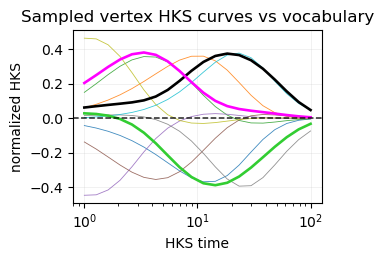

In [135]:
sampled_hks_vertex_ids = np.asarray(SAMPLED_HKS_VERTEX_IDS, dtype=np.int64)
if np.any((sampled_hks_vertex_ids < 0) | (sampled_hks_vertex_ids >= mesh.v.shape[0])):
    raise IndexError(
        f"SAMPLED_HKS_VERTEX_IDS must be valid mesh vertex ids in [0, {mesh.v.shape[0] - 1}]"
    )

normalised_hks = np.asarray(seg["normalised_hks_segment"], dtype=float)
ts_vocab = np.asarray(seg["ts_vocab"], dtype=float)
vocab_curves = np.asarray(vocab["vocab"], dtype=float)

if normalised_hks.shape[1] != ts_vocab.size:
    raise ValueError(
        f"normalised_hks has {normalised_hks.shape[1]} time points but ts_vocab has {ts_vocab.size}"
    )
if vocab_curves.shape[1] != ts_vocab.size:
    raise ValueError(
        f"vocab curves have {vocab_curves.shape[1]} time points but ts_vocab has {ts_vocab.size}"
    )

fig, ax = plt.subplots(figsize=CURVE_FIGSIZE)

# Vocabulary prototypes.
vocab_colors = plt.get_cmap("tab10")(np.linspace(0, 1, vocab_curves.shape[0]))
for i, (curve, color) in enumerate(zip(vocab_curves, vocab_colors)):
    ax.plot(
        ts_vocab,
        curve,
        color=color,
        linewidth=0.6,
        linestyle="-",
        alpha=0.85,
        label=f"vocab {i}",
    )

# Sampled mesh vertices.
for vertex_id, color in zip(sampled_hks_vertex_ids, SAMPLED_HKS_VERTEX_COLORS):
    ax.plot(
        ts_vocab,
        normalised_hks[int(vertex_id)],
        color=color,
        linewidth=1.9,
        linestyle="-",
        label=f"vertex {int(vertex_id)}",
    )

ax.axhline(0.0, color="black", linestyle="--", linewidth=1.1, alpha=0.85)
ax.set_xscale("log")
ax.set_xlabel("HKS time")
ax.set_ylabel("normalized HKS")
ax.set_title("Sampled vertex HKS curves vs vocabulary")
ax.grid(True, linewidth=0.4, alpha=0.3)
fig.subplots_adjust(**CURVE_SUBPLOT_ADJUST)
export_mpl_svg(fig, "sampled_hks_vocab_curves.svg")
plt.show()


## 7) Geodesic Distance Field with Isocurves for One Crypt

This shows the normalized geodesic distance field for one final crypt, black isocurves, the associated initial seed boundary, the final crypt boundary, and the inferred crypt bottom.


In [136]:
from IPython.display import HTML, display

if len(seg["crypts_final"]) == 0:
    raise RuntimeError("No final crypts were detected; adjust segmentation settings before plotting this figure.")

crypt_idx = int(np.clip(DISTANCE_FIELD_CRYPT_INDEX, 0, len(seg["crypts_final"]) - 1))
d_field = np.asarray(seg["d_crypts"], float)[crypt_idx]
bottom_vertex = int(np.asarray(seg["bottom_vertex_ids"], dtype=int)[crypt_idx])
pre_final_boundary_patches, pre_final_boundary_stage = get_pre_final_boundary_patches(seg)

pre_final_patch, pre_final_patch_idx = best_seed_patch_for_final(
    seg["crypts_final"][crypt_idx],
    pre_final_boundary_patches,
)
final_patch = seg["crypts_final"][crypt_idx]

finite = np.isfinite(d_field)
cmax = float(np.nanpercentile(d_field[finite], ISO_MAX_PERCENTILE)) if np.any(finite) else 1.0

fig = plot_organoid_mesh(
    mesh,
    vertex_values=d_field,
    backend="plotly",
    colorscale="Viridis",
    center_at_zero=False,
    vmin=0.0,
    vmax=cmax,
    show_colorbar=True,
    fig_size=(FIG_WIDTH, FIG_HEIGHT),
)
fig.add_trace(isoline_trace(mesh, d_field, n_isocurves=N_ISOCURVES, iso_min=0.0, iso_max=cmax))
add_boundary_curve(
    fig,
    mesh,
    pre_final_patch,
    name=(
        f"{pre_final_boundary_stage} boundary {pre_final_patch_idx + 1}"
        if pre_final_patch_idx >= 0
        else f"{pre_final_boundary_stage} boundary"
    ),
    color=INITIAL_BOUNDARY_COLOR,
    width=BOUNDARY_LINE_WIDTH,
)
add_boundary_curve(
    fig,
    mesh,
    final_patch,
    name=f"final crypt boundary {crypt_idx + 1}",
    color=FINAL_BOUNDARY_COLOR,
    width=BOUNDARY_LINE_WIDTH,
)
add_mesh_overlay(
    fig,
    mesh,
    [bottom_vertex],
    backend="plotly",
    mode="points",
    color="#ff2d55",
    alpha=1.0,
    size=BOTTOM_POINT_SIZE,
    name="crypt bottom",
)
clean_scene(fig, title=f"Crypt {crypt_idx + 1}: normalized geodesic distance with isocurves")
export_plotly_svg(fig, "crypt_distance_isocurves.svg")

# Always show the normal Plotly figure first. This is the most reliable renderer
# in VS Code/Jupyter environments.
fig.show()

# Optional: render a second offline HTML copy with a live camera readout below it.
# Rotate this copy, then copy the camera dict from the text box.
SHOW_CAMERA_READOUT_COPY = True

if SHOW_CAMERA_READOUT_COPY:
    post_script = """
    const gd = document.getElementById('{plot_id}');
    const panel = document.createElement('div');
    panel.style.marginTop = '8px';
    panel.style.fontFamily = 'monospace';
    panel.innerHTML = '<div style="margin-bottom:4px">Camera after rotation:</div>';
    const textarea = document.createElement('textarea');
    textarea.style.width = '100%';
    textarea.style.minHeight = '115px';
    textarea.style.fontFamily = 'monospace';
    textarea.style.fontSize = '12px';
    textarea.readOnly = true;
    panel.appendChild(textarea);
    gd.parentNode.insertBefore(panel, gd.nextSibling);

    function currentCamera() {
        if (!gd._fullLayout || !gd._fullLayout.scene) return null;
        return gd._fullLayout.scene.camera;
    }
    function updateCameraBox() {
        const cam = currentCamera();
        if (!cam) return;
        textarea.value = 'ISOCURVE_CAMERA = ' + JSON.stringify(cam, null, 2);
    }
    gd.on('plotly_relayout', updateCameraBox);
    setTimeout(updateCameraBox, 300);
    """
    display(HTML(fig.to_html(full_html=False, include_plotlyjs=True, post_script=post_script)))


def current_isocurve_camera():
    """Return the Python-side camera. Browser-side rotations are shown in the HTML readout box above."""
    camera = fig.layout.scene.camera.to_plotly_json()
    print("Python-side camera:", repr(camera))
    return camera


Pre-final boundary stage: detected (3 patches)
  detected patch sizes:           [3391, 3332, 1850]
  refined algorithm patch sizes:  [3391, 389, 905, 1850]
  refined boundary patch sizes:   [2096, 389, 905, 1159]


/tmp/ipykernel_2086174/4099884993.py:362: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/crypt_distance_isocurves.svg


## 8) Circumference Curves

Each curve is the inferred surface circumference as a function of normalized distance from the crypt bottom. The dashed vertical line marks the final neckline at `s = 1`; triangle markers show where the original pre-neckline-refinement boundary falls on the final normalized axis.


[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/crypt_circumference_profiles.svg


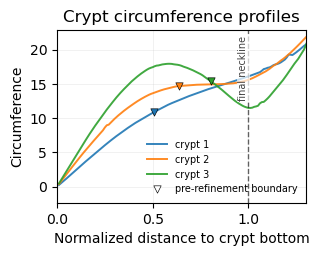

In [137]:
d = np.asarray(seg["d_discretized"], float)
C = np.asarray(seg["circumference_crypts"], float)

# The pre-refinement boundary was normalized to s=1 on the initial axis.
# After neckline normalization, its location on the final x-axis is
# L_initial / L_refined for the corresponding retained crypt.
L_initial_all = np.asarray(seg["L_crypts_initial"], dtype=float)
L_refined = np.asarray(seg["L_crypts"], dtype=float)
keep_idx_final = np.asarray(seg["keep_idx_final"], dtype=np.int64)
pre_refinement_boundary_s = np.full(C.shape[0], np.nan, dtype=float)
valid = (
    (keep_idx_final >= 0)
    & (keep_idx_final < L_initial_all.size)
    & np.isfinite(L_initial_all[keep_idx_final])
    & np.isfinite(L_refined)
    & (L_refined > 0)
)
pre_refinement_boundary_s[valid] = L_initial_all[keep_idx_final[valid]] / L_refined[valid]

fig, ax = plt.subplots(figsize=CURVE_FIGSIZE)
lines = []
for i in range(C.shape[0]):
    (line,) = ax.plot(d, C[i], linewidth=1.4, alpha=0.9, label=f"crypt {i + 1}")
    lines.append(line)

    s0 = pre_refinement_boundary_s[i]
    if np.isfinite(s0) and d.min() <= s0 <= 1.3:
        y0 = float(np.interp(s0, d, C[i]))
        ax.scatter(
            s0,
            y0,
            marker="v",
            s=28,
            color=line.get_color(),
            edgecolor="black",
            linewidth=0.45,
            zorder=5,
        )

ax.axvline(1.0, color="black", linestyle="--", linewidth=1.0, alpha=0.6)
ax.text(
    1.0,
    0.97,
    "final neckline",
    transform=ax.get_xaxis_transform(),
    rotation=90,
    va="top",
    ha="right",
    fontsize=7,
    color="black",
    alpha=0.75,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.7, pad=1.0),
)
ax.scatter([], [], marker="v", s=28, color="white", edgecolor="black", linewidth=0.45, label="pre-refinement boundary")
ax.set_xlim(0.0, 1.3)
visible = (d >= 0.0) & (d <= 1.3)
visible_values = C[:, visible] if np.any(visible) else C
finite_values = visible_values[np.isfinite(visible_values)]
if finite_values.size:
    y_min = float(np.nanmin(finite_values))
    y_max = float(np.nanmax(finite_values))
    y_pad = max(0.05 * (y_max - y_min), 0.25)
    ax.set_ylim(top=y_max + y_pad)
ax.set_xlabel("Normalized distance to crypt bottom")
ax.set_ylabel("Circumference")
ax.set_title("Crypt circumference profiles")
if C.shape[0] <= 12:
    ax.legend(frameon=False, fontsize=7, ncol=1)
ax.grid(True, linewidth=0.4, alpha=0.3)
fig.subplots_adjust(**CURVE_SUBPLOT_ADJUST)
export_mpl_svg(fig, "crypt_circumference_profiles.svg")
plt.show()


## 9) Final Crypt Regions

The final regions are the distance-grown, filtered crypt assignments returned by the modern segmentation pipeline. Bottom points are overlaid for reference.


In [138]:
fig = plot_mesh_by_regions(
    mesh,
    seg["crypts_final"],
    backend="plotly",
    region_kind="auto",
    region_names=[f"crypt {i + 1}" for i in range(len(seg["crypts_final"]))],
    baseline_color="lightgray",
    alpha=1.0,
    fig_size=(FIG_WIDTH, FIG_HEIGHT),
)
add_mesh_overlay(
    fig,
    mesh,
    seg["bottom_vertex_ids"],
    backend="plotly",
    mode="points",
    color="#ff2d55",
    alpha=1.0,
    size=BOTTOM_POINT_SIZE,
    name="crypt bottoms",
)
clean_scene(fig, title="Final crypt regions")
export_plotly_svg(fig, "final_crypt_regions.svg")
fig


/tmp/ipykernel_2086174/4099884993.py:362: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/final_crypt_regions.svg


## 10) Export HKS and Crypt Label Fields

The exported VTP keeps the organoid geometry and adds point-data fields for raw HKS at `t = 1`, initial crypt labels, final crypt labels, and the bottom 75% of the final crypts. Crypt label fields use `0` for vertices outside a crypt and `1, 2, ...` for crypt identity.


In [139]:
# -----------------------------------------------------------------------------
# Export a VTP mesh with HKS at t=1 and crypt label fields
# -----------------------------------------------------------------------------
import vtk
from vtk.util.numpy_support import numpy_to_vtk, numpy_to_vtkIdTypeArray


def patches_to_label_field(patches, n_vertices):
    labels = np.zeros(int(n_vertices), dtype=np.int32)
    for label, patch in enumerate(patches or [], start=1):
        if patch is None or len(patch) == 0:
            continue
        idx = np.fromiter((int(v) for v in patch), dtype=np.int64)
        idx = idx[(idx >= 0) & (idx < labels.size)]
        labels[idx] = int(label)
    return labels


def write_vtp_with_point_fields(path, vertices, faces, point_fields):
    vertices = np.asarray(vertices, dtype=np.float64)
    faces = np.asarray(faces, dtype=np.int64)

    points = vtk.vtkPoints()
    points.SetData(numpy_to_vtk(vertices, deep=True))

    packed_faces = np.column_stack([
        np.full(len(faces), 3, dtype=np.int64),
        faces,
    ]).reshape(-1)
    cells = vtk.vtkCellArray()
    cells.SetCells(len(faces), numpy_to_vtkIdTypeArray(packed_faces, deep=True))

    polydata = vtk.vtkPolyData()
    polydata.SetPoints(points)
    polydata.SetPolys(cells)

    for name, values in point_fields.items():
        values = np.asarray(values)
        if values.shape[0] != vertices.shape[0]:
            raise ValueError(
                f"Point field {name!r} has {values.shape[0]} values; "
                f"expected {vertices.shape[0]}"
            )
        arr = numpy_to_vtk(values, deep=True)
        arr.SetName(str(name))
        polydata.GetPointData().AddArray(arr)

    writer = vtk.vtkXMLPolyDataWriter()
    writer.SetFileName(str(path))
    writer.SetInputData(polydata)
    if writer.Write() != 1:
        raise OSError(f"VTK failed to write {path}")


n_vertices = int(mesh.v.shape[0])
initial_crypt_labels = patches_to_label_field(seg["seed_patches_filtered"], n_vertices)
final_crypt_labels = patches_to_label_field(seg["crypts_final"], n_vertices)

final_axis = np.asarray(seg["d_crypts"], dtype=float)
if final_axis.shape[0] != len(seg["crypts_final"]):
    raise ValueError(
        "seg['d_crypts'] must have one row per final crypt to build "
        "the bottom-75% final crypt labels."
    )

final_bottom75_patches = []
for i, patch in enumerate(seg["crypts_final"]):
    idx = np.fromiter((int(v) for v in patch), dtype=np.int64)
    keep = (
        (idx >= 0)
        & (idx < n_vertices)
        & np.isfinite(final_axis[i, idx])
        & (final_axis[i, idx] <= 0.75)
    )
    final_bottom75_patches.append(set(idx[keep].astype(int).tolist()))
final_bottom75_labels = patches_to_label_field(final_bottom75_patches, n_vertices)

hks_t1_export = np.asarray(compute_hks(mesh, t=[1.0], coeffs=False), dtype=float)[:, 0]

vtp_export_path = FIGURE_EXPORT_DIR / f"{label_uid}_hks_t1_crypt_fields.vtp"
write_vtp_with_point_fields(
    vtp_export_path,
    mesh.v,
    mesh.f,
    {
        "hks_t1": hks_t1_export.astype(np.float32),
        "crypt_initial": initial_crypt_labels,
        "crypt_final": final_crypt_labels,
        "crypt_final_bottom75": final_bottom75_labels,
    },
)

print(f"[export] {vtp_export_path}")
print("point fields: hks_t1, crypt_initial, crypt_final, crypt_final_bottom75")
print("crypt_initial labels:", sorted(np.unique(initial_crypt_labels).astype(int).tolist()))
print("crypt_final labels:", sorted(np.unique(final_crypt_labels).astype(int).tolist()))
print("crypt_final_bottom75 labels:", sorted(np.unique(final_bottom75_labels).astype(int).tolist()))


[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/day4p5_B03_144_hks_t1_crypt_fields.vtp
point fields: hks_t1, crypt_initial, crypt_final, crypt_final_bottom75
crypt_initial labels: [0, 1, 2, 3]
crypt_final labels: [0, 1, 2, 3]
crypt_final_bottom75 labels: [0, 1, 2, 3]


## 11) Crypt, Neck, and Villus Regions

Classify every mesh vertex by its minimum final normalized crypt-axis distance: crypt for `d_crypts <= 0.75`, neck for `0.75 < d_crypts <= 1.1`, and villus for `d_crypts > 1.1`. The VTP export uses integer labels `1 = Crypt`, `2 = Neck`, and `3 = Villus`.


In [140]:
def crypt_neck_villus_fields(seg, n_vertices, crypt_max_s=CRYPT_REGION_MAX_S, neck_max_s=NECK_REGION_MAX_S):
    """Return min final crypt-axis distance and categorical crypt/neck/villus labels."""
    d = np.asarray(seg["d_crypts"], dtype=float)
    if d.ndim == 1:
        d = d[None, :]
    if d.ndim != 2:
        raise ValueError(f"seg['d_crypts'] must be a 2D array; got shape {d.shape}")
    if d.shape[1] != int(n_vertices):
        raise ValueError(
            f"seg['d_crypts'] has {d.shape[1]} vertices, expected {int(n_vertices)}"
        )

    finite = np.isfinite(d)
    any_finite = finite.any(axis=0)
    d_work = np.where(finite, d, np.inf)
    d_min = np.full(int(n_vertices), np.nan, dtype=float)
    d_min[any_finite] = np.min(d_work[:, any_finite], axis=0)

    # Vertices without a finite distance are treated as villus/background for plotting.
    d_for_label = np.where(np.isfinite(d_min), d_min, np.inf)
    region = np.full(int(n_vertices), 3, dtype=np.int32)
    region[d_for_label <= float(crypt_max_s)] = 1
    region[(d_for_label > float(crypt_max_s)) & (d_for_label <= float(neck_max_s))] = 2
    region[d_for_label > float(neck_max_s)] = 3
    return d_min, region


def majority_face_labels(vertex_labels, faces):
    vertex_labels = np.asarray(vertex_labels, dtype=np.int32)
    faces = np.asarray(faces, dtype=np.int64)
    face_labels = np.full(faces.shape[0], 0, dtype=np.int32)
    for face_i, tri in enumerate(faces):
        labels, counts = np.unique(vertex_labels[tri], return_counts=True)
        face_labels[face_i] = int(labels[np.argmax(counts)])
    return face_labels


n_vertices = int(mesh.v.shape[0])
d_crypts_min, crypt_neck_villus_region = crypt_neck_villus_fields(seg, n_vertices)
faces = np.asarray(mesh.f, dtype=np.int64)
vertices = np.asarray(mesh.v, dtype=float)
face_regions = majority_face_labels(crypt_neck_villus_region, faces)
face_colors = [
    CRYPT_NECK_VILLUS_COLORS.get(int(label), "#d9d9d9")
    for label in face_regions
]

fig = go.Figure()
fig.add_trace(
    go.Mesh3d(
        x=vertices[:, 0],
        y=vertices[:, 1],
        z=vertices[:, 2],
        i=faces[:, 0],
        j=faces[:, 1],
        k=faces[:, 2],
        facecolor=face_colors,
        opacity=1.0,
        flatshading=True,
        hoverinfo="skip",
        name="crypt/neck/villus regions",
        showlegend=False,
    )
)

for label in (1, 2, 3):
    present = bool(np.any(crypt_neck_villus_region == label))
    if not present:
        continue
    fig.add_trace(
        go.Scatter3d(
            x=[None],
            y=[None],
            z=[None],
            mode="markers",
            marker=dict(size=8, color=CRYPT_NECK_VILLUS_COLORS[label]),
            name=CRYPT_NECK_VILLUS_NAMES[label],
            showlegend=True,
        )
    )

clean_scene(fig, title="Crypt, neck, and villus regions")
export_plotly_svg(fig, "crypt_neck_villus_regions.svg")

region_vtp_export_path = FIGURE_EXPORT_DIR / f"{label_uid}_crypt_neck_villus_regions.vtp"
write_vtp_with_point_fields(
    region_vtp_export_path,
    mesh.v,
    mesh.f,
    {
        "d_crypts_min": d_crypts_min.astype(np.float32),
        "crypt_neck_villus_region": crypt_neck_villus_region.astype(np.int32),
        "region_crypt": (crypt_neck_villus_region == 1).astype(np.int8),
        "region_neck": (crypt_neck_villus_region == 2).astype(np.int8),
        "region_villus": (crypt_neck_villus_region == 3).astype(np.int8),
    },
)

region_counts = {
    CRYPT_NECK_VILLUS_NAMES[label]: int(np.sum(crypt_neck_villus_region == label))
    for label in (1, 2, 3)
}
print(f"[export] {region_vtp_export_path}")
print("point fields: d_crypts_min, crypt_neck_villus_region, region_crypt, region_neck, region_villus")
print("region counts:", region_counts)
fig


/tmp/ipykernel_2086174/4099884993.py:362: DeprecationWarning:


Support for Kaleido versions less than 1.0.0 is deprecated and will be removed after September 2025.
Please upgrade Kaleido to version 1.0.0 or greater (`pip install 'kaleido>=1.0.0'` or `pip install 'plotly[kaleido]'`).




[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/crypt_neck_villus_regions.svg
[export] /home/fmoller/Projects/LearningOrganoids/OrganoGraph/exports/single_organoid_crypt_segmentation/day4p5_B03_144/day4p5_B03_144_crypt_neck_villus_regions.vtp
point fields: d_crypts_min, crypt_neck_villus_region, region_crypt, region_neck, region_villus
region counts: {'Crypt': 3385, 'Neck': 2076, 'Villus': 12540}


## 12) Stored Intermediates

The `seg` dictionary contains the major intermediate arrays and patch lists used by the figures above.


In [141]:
for key, value in seg.items():
    if isinstance(value, list):
        print(f"{key:30s}: list[{len(value)}]")
    else:
        shape = getattr(value, "shape", None)
        print(f"{key:30s}: {type(value).__name__}" + (f" shape={shape}" if shape is not None else ""))


vertex_areas                  : ndarray shape=(18001,)
seed_patches_raw              : list[3]
encoding                      : ndarray shape=(18001, 8)
vertex_score                  : ndarray shape=(18001,)
patch_scores                  : list[3]
ts_mesh                       : ndarray shape=(20,)
ts_vocab                      : ndarray shape=(20,)
hks_segment                   : ndarray shape=(18001, 20)
normalised_hks_segment        : ndarray shape=(18001, 20)
seed_patches_filtered         : list[3]
filter_info_initial           : list[2]
keep_idx_initial              : ndarray shape=(3,)
refined_patches               : list[4]
refined_boundary_patches      : list[4]
refine_vars                   : dict
d_crypts_initial              : ndarray shape=(4, 18001)
L_crypts_initial              : ndarray shape=(4,)
bottom_vertex_ids_initial     : ndarray shape=(4,)
d_discretized                 : ndarray shape=(200,)
circumference_crypts_premerge : ndarray shape=(4, 200)
d_crypts_premerge 